In [62]:
pip install pyreadr

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [63]:
pip install statsmodels

Defaulting to user installation because normal site-packages is not writeableNote: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [64]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [65]:
import pyreadr

result = pyreadr.read_r(r'C:\Users\Samarth\Downloads\TEP_data\TEP_FaultFree_Training.RData')

df = result[None] if None in result else list(result.values())[0]
df = pd.DataFrame(df)

In [66]:
df.head()

,faultNumber,simulationRun,sample,xmeas_1,xmeas_2,xmeas_3,xmeas_4,xmeas_5,xmeas_6,xmeas_7,...,xmv_2,xmv_3,xmv_4,xmv_5,xmv_6,xmv_7,xmv_8,xmv_9,xmv_10,xmv_11
0,0.0,1.0,1,0.25038,3674.0,4529.0,9.2320,26.889,42.402,2704.3,...,53.744,24.657,62.544,22.137,39.935,42.323,47.757,47.510,41.258,18.447
1,0.0,1.0,2,0.25109,3659.4,4556.6,9.4264,26.721,42.576,2705.0,...,53.414,24.588,59.259,22.084,40.176,38.554,43.692,47.427,41.359,17.194
2,0.0,1.0,3,0.25038,3660.3,4477.8,9.4426,26.875,42.070,2706.2,...,54.357,24.666,61.275,22.380,40.244,38.990,46.699,47.468,41.199,20.530
3,0.0,1.0,4,0.24977,3661.3,4512.1,9.4776,26.758,42.063,2707.2,...,53.946,24.725,59.856,22.277,40.257,38.072,47.541,47.658,41.643,18.089
4,0.0,1.0,5,0.29405,3679.0,4497.0,9.3381,26.889,42.650,2705.1,...,53.658,28.797,60.717,21.947,39.144,41.955,47.645,47.346,41.507,18.461


In [67]:
df.isnull().sum()

faultNumber      0
simulationRun    0
sample           0
xmeas_1          0
xmeas_2          0
xmeas_3          0
xmeas_4          0
xmeas_5          0
xmeas_6          0
xmeas_7          0
xmeas_8          0
xmeas_9          0
xmeas_10         0
xmeas_11         0
xmeas_12         0
xmeas_13         0
xmeas_14         0
xmeas_15         0
xmeas_16         0
xmeas_17         0
xmeas_18         0
xmeas_19         0
xmeas_20         0
xmeas_21         0
xmeas_22         0
xmeas_23         0
xmeas_24         0
xmeas_25         0
xmeas_26         0
xmeas_27         0
xmeas_28         0
xmeas_29         0
xmeas_30         0
xmeas_31         0
xmeas_32         0
xmeas_33         0
xmeas_34         0
xmeas_35         0
xmeas_36         0
xmeas_37         0
xmeas_38         0
xmeas_39         0
xmeas_40         0
xmeas_41         0
xmv_1            0
xmv_2            0
xmv_3            0
xmv_4            0
xmv_5            0
xmv_6            0
xmv_7            0
xmv_8            0
xmv_9       

In [68]:
df.duplicated().sum()

0

In [69]:
df['faultNumber'].value_counts()

0.0    250000
Name: faultNumber, dtype: int64

<Axes: >

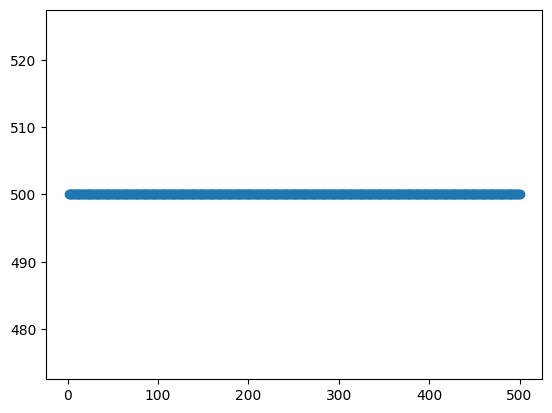

In [70]:
df['simulationRun'].value_counts().sort_values(ascending=False).plot(style='o')


In [71]:
print(df['simulationRun'].max())

500.0


<Axes: >

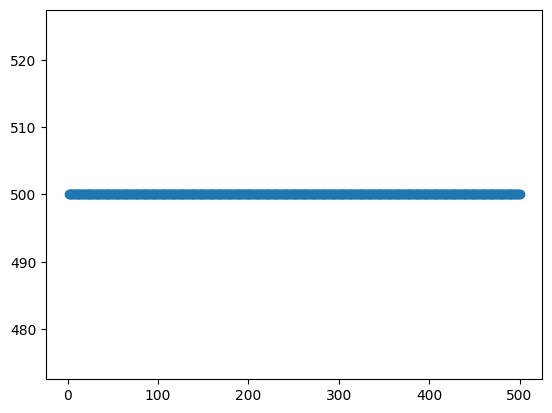

In [72]:
df['sample'].value_counts().sort_values(ascending=False).plot(style='o')

In [73]:
print(df['sample'].max())


500


In [74]:
assert len(df)==df['simulationRun'].max()*df['sample'].max(), 'sanity check does not hold'

In [75]:
X_dict = {
'XMEAS_1':'A_feed_stream',
'XMEAS_2':'D_feed_stream',
'XMEAS_3':'E_feed_stream',
'XMEAS_4':'Total_fresh_feed_stripper',
'XMEAS_5':'Recycle_flow_into_rxtr',
'XMEAS_6':'Reactor_feed_rate',
'XMEAS_7':'Reactor_pressure',
'XMEAS_8':'Reactor_level',
'XMEAS_9':'Reactor_temp',
'XMEAS_10':'Purge_rate',
'XMEAS_11':'Separator_temp',
'XMEAS_12':'Separator_level',
'XMEAS_13':'Separator_pressure',
'XMEAS_14':'Separator_underflow',
'XMEAS_15':'Stripper_level',
'XMEAS_16':'Stripper_pressure',
'XMEAS_17':'Stripper_underflow',
'XMEAS_18':'Stripper_temperature',
'XMEAS_19':'Stripper_steam_flow',
'XMEAS_20':'Compressor_work',
'XMEAS_21':'Reactor_cooling_water_outlet_temp',
'XMEAS_22':'Condenser_cooling_water_outlet_temp',
'XMEAS_23':'Composition_of_A_rxtr_feed',
'XMEAS_24':'Composition_of_B_rxtr_feed',
'XMEAS_25':'Composition_of_C_rxtr_feed',
'XMEAS_26':'Composition_of_D_rxtr_feed',
'XMEAS_27':'Composition_of_E_rxtr_feed',
'XMEAS_28':'Composition_of_F_rxtr_feed',
'XMEAS_29':'Composition_of_A_purge',
'XMEAS_30':'Composition_of_B_purge',
'XMEAS_31':'Composition_of_C_purge',
'XMEAS_32':'Composition_of_D_purge',
'XMEAS_33':'Composition_of_E_purge',
'XMEAS_34':'Composition_of_F_purge',
'XMEAS_35':'Composition_of_G_purge',
'XMEAS_36':'Composition_of_H_purge',
'XMEAS_37':'Composition_of_D_product',
'XMEAS_38':'Composition_of_E_product',
'XMEAS_39':'Composition_of_F_product',
'XMEAS_40':'Composition_of_G_product',
'XMEAS_41':'Composition_of_H_product',
'XMV_1':'D_feed_flow_valve',
'XMV_2':'E_feed_flow_valve',
'XMV_3':'A_feed_flow_valve',
'XMV_4':'Total_feed_flow_stripper_valve',
'XMV_5':'Compressor_recycle_valve',
'XMV_6':'Purge_valve',
'XMV_7':'Separator_pot_liquid_flow_valve',
'XMV_8':'Stripper_liquid_product_flow_valve',
'XMV_9':'Stripper_steam_valve',
'XMV_10':'Reactor_cooling_water_flow_valve',
'XMV_11':'Condenser_cooling_water_flow_valve',
'XMV_12':'Agitator_speed'
   }

df = df.rename(columns = lambda x:X_dict[x.upper()] if x.upper() in X_dict.keys()  else x)

In [76]:
df.describe()

,faultNumber,simulationRun,sample,A_feed_stream,D_feed_stream,E_feed_stream,Total_fresh_feed_stripper,Recycle_flow_into_rxtr,Reactor_feed_rate,Reactor_pressure,...,E_feed_flow_valve,A_feed_flow_valve,Total_feed_flow_stripper_valve,Compressor_recycle_valve,Purge_valve,Separator_pot_liquid_flow_valve,Stripper_liquid_product_flow_valve,Stripper_steam_valve,Reactor_cooling_water_flow_valve,Condenser_cooling_water_flow_valve
count,250000.0,250000.000000,250000.000000,250000.000000,250000.000000,250000.00000,250000.000000,250000.000000,250000.000000,250000.000000,...,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000
mean,0.0,250.500000,250.500000,0.250482,3663.785706,4508.81979,9.347101,26.902196,42.337598,2705.037865,...,53.973668,24.639472,61.298501,22.216644,40.055456,38.098898,46.534295,47.958591,41.104304,18.118706
std,0.0,144.337567,144.337567,0.030873,34.006357,39.21542,0.085721,0.211485,0.218513,7.525596,...,0.469663,3.037743,1.243805,0.530156,1.526751,2.965266,2.351304,2.716520,0.540817,1.463678
min,0.0,1.000000,1.000000,0.122450,3511.800000,4336.90000,8.972700,25.951000,41.394000,2672.300000,...,52.095000,11.977000,55.961000,19.749000,33.389000,25.959000,36.937000,36.641000,38.586000,11.705000
25%,0.0,125.750000,125.750000,0.229770,3640.800000,4482.40000,9.289300,26.758000,42.188000,2700.100000,...,53.657000,22.602000,60.453000,21.864000,39.021000,36.081000,44.931000,46.265000,40.740000,17.130000
50%,0.0,250.500000,250.500000,0.250510,3663.700000,4508.80000,9.347100,26.902000,42.338000,2705.000000,...,53.974000,24.644000,61.298000,22.217000,40.058000,38.091000,46.530000,47.820000,41.104000,18.119000
75%,0.0,375.250000,375.250000,0.271200,3686.800000,4535.30000,9.405100,27.046000,42.487000,2710.000000,...,54.290000,26.674000,62.144000,22.568000,41.084000,40.117000,48.140000,49.651000,41.470000,19.111000
max,0.0,500.000000,500.000000,0.391740,3808.400000,4683.70000,9.729800,27.818000,43.257000,2739.100000,...,56.118000,38.351000,66.443000,24.525000,47.498000,50.729000,56.443000,59.616000,43.930000,24.762000


In [77]:
df.columns

Index(['faultNumber', 'simulationRun', 'sample', 'A_feed_stream',
       'D_feed_stream', 'E_feed_stream', 'Total_fresh_feed_stripper',
       'Recycle_flow_into_rxtr', 'Reactor_feed_rate', 'Reactor_pressure',
       'Reactor_level', 'Reactor_temp', 'Purge_rate', 'Separator_temp',
       'Separator_level', 'Separator_pressure', 'Separator_underflow',
       'Stripper_level', 'Stripper_pressure', 'Stripper_underflow',
       'Stripper_temperature', 'Stripper_steam_flow', 'Compressor_work',
       'Reactor_cooling_water_outlet_temp',
       'Condenser_cooling_water_outlet_temp', 'Composition_of_A_rxtr_feed',
       'Composition_of_B_rxtr_feed', 'Composition_of_C_rxtr_feed',
       'Composition_of_D_rxtr_feed', 'Composition_of_E_rxtr_feed',
       'Composition_of_F_rxtr_feed', 'Composition_of_A_purge',
       'Composition_of_B_purge', 'Composition_of_C_purge',
       'Composition_of_D_purge', 'Composition_of_E_purge',
       'Composition_of_F_purge', 'Composition_of_G_purge',
       'Comp

<Axes: >

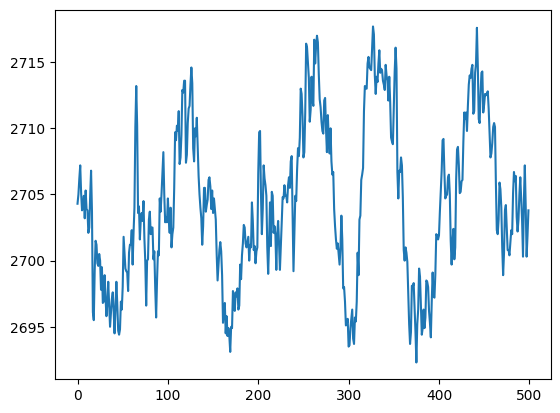

In [78]:
df[df['simulationRun']==1]['Reactor_pressure'].plot()

2703.6453999999994 4.917397730597134
2705.1787999999997 8.747719460036592
2704.4882 7.937110065532977
2704.4103999999993 8.414112336594142
2704.9485999999997 8.637236928759506


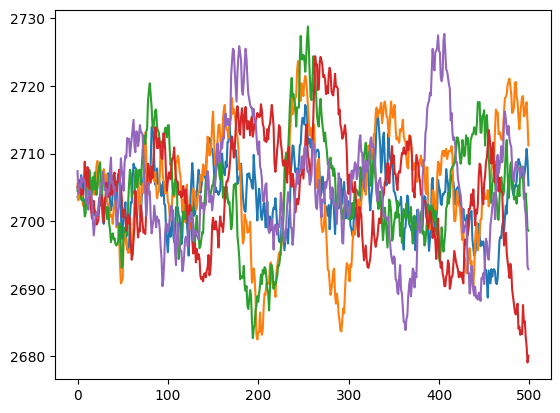

In [79]:
import random
for run in random.sample(range(1,500),5):
    tmp = df[df['simulationRun']==run].reset_index()
    item = 'Reactor_pressure'

    tmp[item].plot()
    print(tmp[item].mean(), tmp[item].std())

C:\Users\Samarth\AppData\Local\Temp\ipykernel_8312\2414426998.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered.drop(columns=['simulationRun', 'faultNumber', 'sample'], inplace=True)


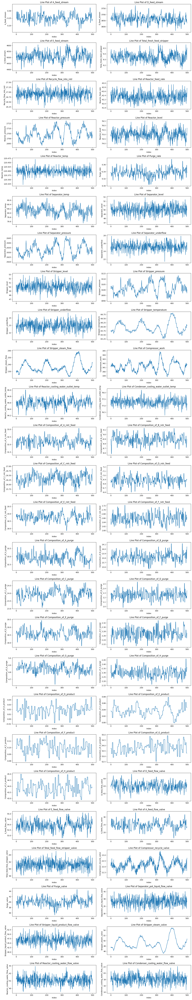

In [80]:
import matplotlib.pyplot as plt
import math

# Filter DataFrame and drop irrelevant columns
df_filtered = df[df['simulationRun'] == 1]
df_filtered.drop(columns=['simulationRun', 'faultNumber', 'sample'], inplace=True)

# Number of variables
num_columns = len(df_filtered.columns)

# Define the number of rows and columns for subplots grid
cols = 2  # Number of columns in the grid
rows = math.ceil(num_columns / cols)  # Calculate rows to fit all variables

# Create subplots grid
fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 3))  # Adjust the figure size for better spacing
axes = axes.flatten()  # Flatten to easily iterate over it

# Plot each column in a separate subplot
for i, column in enumerate(df_filtered.columns):
    df_filtered[column].plot(ax=axes[i])
    axes[i].set_title(f'Line Plot of {column}')
    axes[i].set_xlabel('Index')
    axes[i].set_ylabel(column)

# Remove empty subplots (in case the grid is larger than the number of variables)
for i in range(num_columns, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()


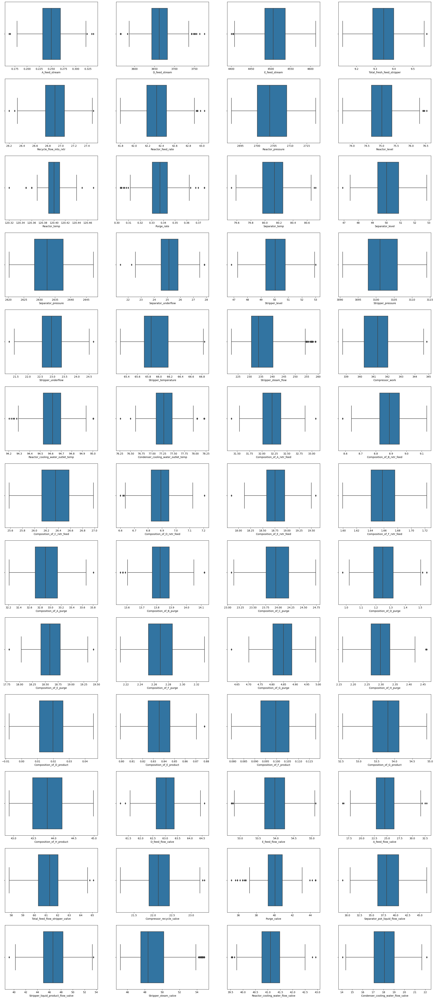

In [81]:
fig, ax = plt.subplots(13,4,figsize=(30,70))

for i,column in enumerate(df_filtered):
    sns.boxplot(data=df_filtered,x=column,ax=ax.ravel()[i])

C:\Users\Samarth\AppData\Local\Temp\ipykernel_8312\386459655.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered.drop(columns=['simulationRun', 'faultNumber', 'sample'], inplace=True)


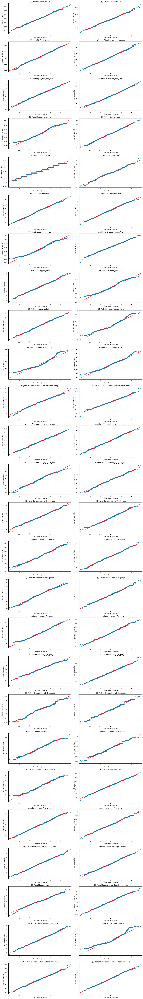

In [82]:
import matplotlib.pyplot as plt
from statsmodels.graphics.gofplots import qqplot
import math

# Filter DataFrame and drop irrelevant columns
df_filtered = df[df['simulationRun'] == 1]
df_filtered.drop(columns=['simulationRun', 'faultNumber', 'sample'], inplace=True)

# Number of variables
num_columns = len(df_filtered.columns)

# Define the number of rows and columns for subplots grid
cols = 2  # Number of columns in the grid
rows = math.ceil(num_columns / cols)  # Calculate rows to fit all variables

# Create subplots grid
fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 4))  # Adjust the figure size for better spacing
axes = axes.flatten()  # Flatten to easily iterate over it

# Plot QQ plots for each column
for i, column in enumerate(df_filtered.columns):
    qqplot(df_filtered[column].values, ax=axes[i], line='s')
    axes[i].set_title(f'QQ Plot of {column}')

# Remove empty subplots (in case the grid is larger than the number of variables)
for i in range(num_columns, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()


In [83]:
result_f = pyreadr.read_r(r'C:\Users\Samarth\Downloads\TEP_data\TEP_Faulty_Training.RData')
df_fault = result_f[None] if None in result_f else list(result_f.values())[0]
df_fault = pd.DataFrame(df_fault)

MemoryError: Unable to allocate 1.94 GiB for an array with shape (52, 5000000) and data type float64

In [23]:
df_fault.head()

,faultNumber,simulationRun,sample,xmeas_1,xmeas_2,xmeas_3,xmeas_4,xmeas_5,xmeas_6,xmeas_7,...,xmv_2,xmv_3,xmv_4,xmv_5,xmv_6,xmv_7,xmv_8,xmv_9,xmv_10,xmv_11
0,1,1.0,1,0.25038,3674.0,4529.0,9.2320,26.889,42.402,2704.3,...,53.744,24.657,62.544,22.137,39.935,42.323,47.757,47.510,41.258,18.447
1,1,1.0,2,0.25109,3659.4,4556.6,9.4264,26.721,42.576,2705.0,...,53.414,24.588,59.259,22.084,40.176,38.554,43.692,47.427,41.359,17.194
2,1,1.0,3,0.25038,3660.3,4477.8,9.4426,26.875,42.070,2706.2,...,54.357,24.666,61.275,22.380,40.244,38.990,46.699,47.468,41.199,20.530
3,1,1.0,4,0.24977,3661.3,4512.1,9.4776,26.758,42.063,2707.2,...,53.946,24.725,59.856,22.277,40.257,38.072,47.541,47.658,41.643,18.089
4,1,1.0,5,0.29405,3679.0,4497.0,9.3381,26.889,42.650,2705.1,...,53.658,28.797,60.717,21.947,39.144,41.955,47.645,47.346,41.507,18.461


In [24]:
df_fault.isnull().sum()

,0
faultNumber,0
simulationRun,0
sample,0
xmeas_1,0
xmeas_2,0
xmeas_3,0
xmeas_4,0
xmeas_5,0
xmeas_6,0
xmeas_7,0


In [25]:
df_fault.duplicated().sum()

0

In [26]:
df_fault['faultNumber'].value_counts()

,count
faultNumber,
1,250000
2,250000
19,250000
18,250000
17,250000
16,250000
15,250000
14,250000
13,250000


<Axes: xlabel='simulationRun'>

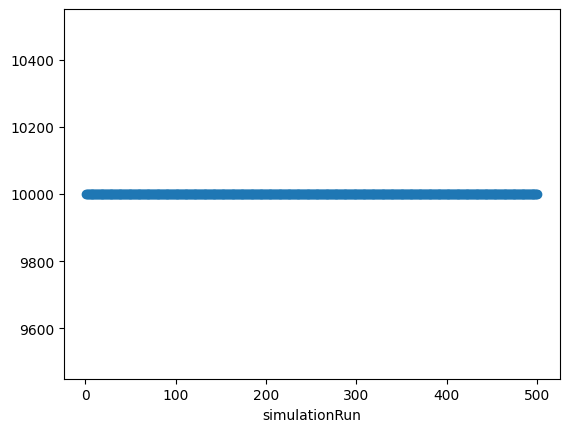

In [27]:
df_fault['simulationRun'].value_counts().sort_values(ascending=False).plot(style='o')


In [28]:
print(df_fault['simulationRun'].max())

500.0


<Axes: xlabel='sample'>

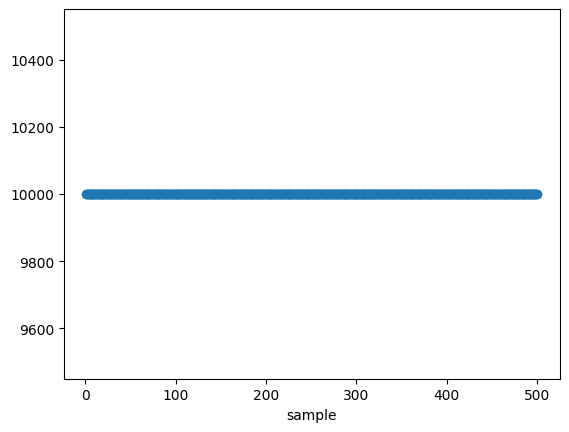

In [29]:
df_fault['sample'].value_counts().sort_values(ascending=False).plot(style='o')

In [30]:
print(df_fault['sample'].max())

500


In [31]:
assert len(df_fault)==df_fault['simulationRun'].max()*df_fault['sample'].max()*20, 'sanity check does not hold'

In [32]:
df_fault = df_fault.rename(columns = lambda x:X_dict[x.upper()] if x.upper() in X_dict.keys()  else x)

In [33]:
df_fault.describe()

,faultNumber,simulationRun,sample,A_feed_stream,D_feed_stream,E_feed_stream,Total_fresh_feed_stripper,Recycle_flow_into_rxtr,Reactor_feed_rate,Reactor_pressure,...,E_feed_flow_valve,A_feed_flow_valve,Total_feed_flow_stripper_valve,Compressor_recycle_valve,Purge_valve,Separator_pot_liquid_flow_valve,Stripper_liquid_product_flow_valve,Stripper_steam_valve,Reactor_cooling_water_flow_valve,Condenser_cooling_water_flow_valve
count,5.000000e+06,5.000000e+06,5.000000e+06,5.000000e+06,5.000000e+06,5.000000e+06,5.000000e+06,5.000000e+06,5.000000e+06,5.000000e+06,...,5.000000e+06,5.000000e+06,5.000000e+06,5.000000e+06,5.000000e+06,5.000000e+06,5.000000e+06,5.000000e+06,5.000000e+06,5.000000e+06
mean,1.050000e+01,2.505000e+02,2.505000e+02,2.613588e-01,3.663777e+03,4.506046e+03,9.370345e+00,2.690156e+01,4.236419e+01,2.723005e+03,...,5.431755e+01,3.043177e+01,6.324830e+01,2.295485e+01,3.992297e+01,3.807265e+01,4.643742e+01,5.060598e+01,4.194845e+01,1.884376e+01
std,5.766282e+00,1.443373e+02,1.443373e+02,1.495384e-01,4.316941e+01,1.110368e+02,3.646151e-01,2.320034e-01,3.172128e-01,7.599384e+01,...,5.258092e+00,2.048365e+01,7.400080e+00,1.108258e+01,1.293348e+01,2.949138e+00,2.358468e+00,1.759840e+01,1.001227e+01,5.176705e+00
min,1.000000e+00,1.000000e+00,1.000000e+00,-4.735000e-03,3.327400e+03,3.540700e+03,6.639900e+00,2.538600e+01,3.965600e+01,2.413800e+03,...,3.118400e+01,-2.718600e-01,-4.893100e-03,-9.941000e-02,0.000000e+00,2.280100e+01,3.492300e+01,-3.635500e-01,-2.809500e-01,-5.327000e-03
25%,5.750000e+00,1.257500e+02,1.257500e+02,2.183000e-01,3.636500e+03,4.469000e+03,9.264200e+00,2.676000e+01,4.218100e+01,2.697600e+03,...,5.349700e+01,2.228000e+01,6.031400e+01,2.142300e+01,3.831300e+01,3.604900e+01,4.487800e+01,4.547900e+01,4.057500e+01,1.714300e+01
50%,1.050000e+01,2.505000e+02,2.505000e+02,2.511300e-01,3.663300e+03,4.508500e+03,9.355200e+00,2.690100e+01,4.234800e+01,2.705600e+03,...,5.397000e+01,2.521500e+01,6.149900e+01,2.212900e+01,3.996700e+01,3.815000e+01,4.633900e+01,4.806500e+01,4.120600e+01,1.829500e+01
75%,1.525000e+01,3.752500e+02,3.752500e+02,2.832100e-01,3.690200e+03,4.548000e+03,9.456800e+00,2.704300e+01,4.252400e+01,2.715000e+03,...,5.444300e+01,2.879700e+01,6.284100e+01,2.273800e+01,4.150700e+01,3.999100e+01,4.803100e+01,5.188700e+01,4.194900e+01,1.953700e+01
max,2.000000e+01,5.000000e+02,5.000000e+02,1.017500e+00,3.906700e+03,5.175800e+03,1.224000e+01,2.848600e+01,4.465300e+01,3.000500e+03,...,1.000000e+02,1.001900e+02,1.000200e+02,1.001100e+02,9.752800e+01,5.312100e+01,5.998000e+01,1.005200e+02,1.003200e+02,1.000100e+02


In [34]:
df_fault[df_fault['simulationRun']==1].describe()

,faultNumber,simulationRun,sample,A_feed_stream,D_feed_stream,E_feed_stream,Total_fresh_feed_stripper,Recycle_flow_into_rxtr,Reactor_feed_rate,Reactor_pressure,...,E_feed_flow_valve,A_feed_flow_valve,Total_feed_flow_stripper_valve,Compressor_recycle_valve,Purge_valve,Separator_pot_liquid_flow_valve,Stripper_liquid_product_flow_valve,Stripper_steam_valve,Reactor_cooling_water_flow_valve,Condenser_cooling_water_flow_valve
count,10000.00000,10000.0,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,...,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,10.50000,1.0,250.500000,0.266325,3661.164830,4505.516690,9.348639,26.904850,42.353603,2717.108280,...,53.837961,30.927638,62.570665,21.151210,40.360206,38.251749,46.558399,51.465879,43.084767,19.728465
std,5.76657,0.0,144.344496,0.146969,42.245927,105.971562,0.306214,0.236367,0.293656,70.113404,...,2.182148,20.180334,5.443094,4.696159,12.368467,3.014745,2.384102,17.074236,9.492904,8.068401
min,1.00000,1.0,1.000000,-0.003183,3470.900000,3884.300000,7.494400,25.592000,40.613000,2489.800000,...,43.749000,0.000000,48.189000,-0.040454,0.000000,27.967000,38.094000,-0.141770,29.279000,11.148000
25%,5.75000,1.0,125.750000,0.225110,3636.600000,4472.175000,9.267000,26.764000,42.178000,2697.200000,...,53.507000,22.774250,60.246000,21.325000,38.667750,36.252000,44.968500,47.058000,40.644000,17.173000
50%,10.50000,1.0,250.500000,0.251355,3661.200000,4506.700000,9.352950,26.896000,42.337000,2703.900000,...,53.958000,25.181000,61.441000,22.007500,40.103500,38.255000,46.423500,48.958000,41.265000,18.287000
75%,15.25000,1.0,375.250000,0.283477,3686.700000,4546.300000,9.444925,27.056000,42.513000,2712.700000,...,54.384000,28.794000,62.693000,22.539000,41.538000,40.368000,48.182250,52.397000,42.034250,19.584000
max,20.00000,1.0,500.000000,1.005200,3820.200000,5013.300000,11.157000,28.077000,43.830000,3000.000000,...,82.353000,100.060000,95.385000,39.503000,94.993000,47.904000,55.399000,100.340000,100.030000,87.332000


<Axes: >

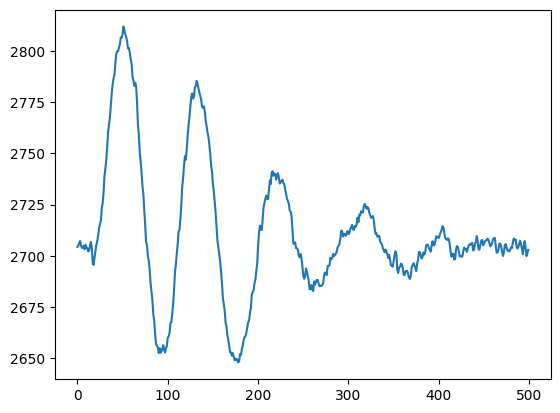

In [35]:
df_fault[(df_fault['simulationRun']==1) & (df_fault['faultNumber']==1)]['Reactor_pressure'].plot()

2709.0566 33.75993784423324
2710.1362000000004 30.29085640128133
2709.6728000000003 30.027990618774382
2711.6204 29.61234211356646
2710.5516 31.283138060204053


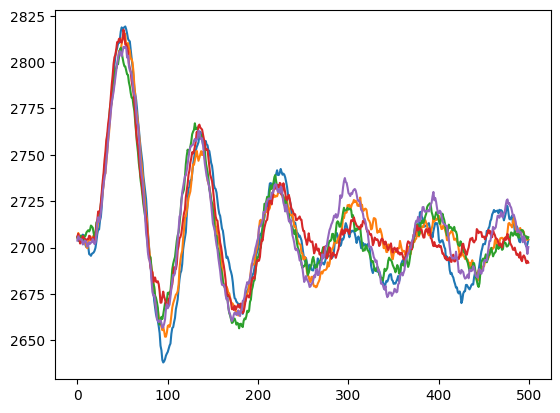

In [36]:
import random
for run in random.sample(range(1,500),5):
    tmp = df_fault[(df_fault['simulationRun']==run) & (df_fault['faultNumber']==1)].reset_index()
    item = 'Reactor_pressure'

    tmp[item].plot()
    print(tmp[item].mean(), tmp[item].std())

2705.5548 5.696305183668722
2705.3817999999997 7.551400934405765
2705.192 8.051590664238267
2704.8304 6.983900455414737
2704.4044 8.277824920280786


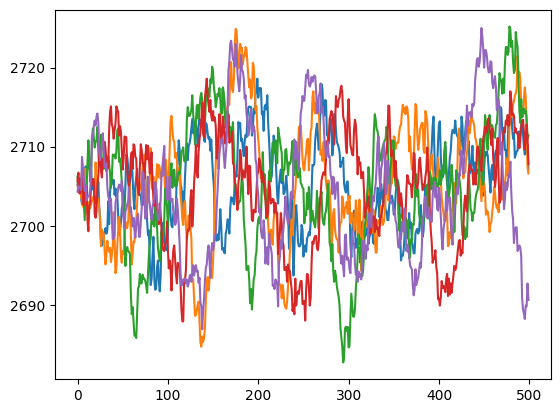

In [37]:
import random
for run in random.sample(range(1,500),5):
    tmp = df_fault[(df_fault['simulationRun']==run) & (df_fault['faultNumber']==3)].reset_index()
    item = 'Reactor_pressure'

    tmp[item].plot()
    print(tmp[item].mean(), tmp[item].std())

In [38]:
DF = pd.concat([df,df_fault]) # Join both fault free and faulty dataset
DF.head()

,faultNumber,simulationRun,sample,A_feed_stream,D_feed_stream,E_feed_stream,Total_fresh_feed_stripper,Recycle_flow_into_rxtr,Reactor_feed_rate,Reactor_pressure,...,E_feed_flow_valve,A_feed_flow_valve,Total_feed_flow_stripper_valve,Compressor_recycle_valve,Purge_valve,Separator_pot_liquid_flow_valve,Stripper_liquid_product_flow_valve,Stripper_steam_valve,Reactor_cooling_water_flow_valve,Condenser_cooling_water_flow_valve
0,0.0,1.0,1,0.25038,3674.0,4529.0,9.2320,26.889,42.402,2704.3,...,53.744,24.657,62.544,22.137,39.935,42.323,47.757,47.510,41.258,18.447
1,0.0,1.0,2,0.25109,3659.4,4556.6,9.4264,26.721,42.576,2705.0,...,53.414,24.588,59.259,22.084,40.176,38.554,43.692,47.427,41.359,17.194
2,0.0,1.0,3,0.25038,3660.3,4477.8,9.4426,26.875,42.070,2706.2,...,54.357,24.666,61.275,22.380,40.244,38.990,46.699,47.468,41.199,20.530
3,0.0,1.0,4,0.24977,3661.3,4512.1,9.4776,26.758,42.063,2707.2,...,53.946,24.725,59.856,22.277,40.257,38.072,47.541,47.658,41.643,18.089
4,0.0,1.0,5,0.29405,3679.0,4497.0,9.3381,26.889,42.650,2705.1,...,53.658,28.797,60.717,21.947,39.144,41.955,47.645,47.346,41.507,18.461


In [39]:
DF[DF['simulationRun']==1].iloc[:,3:].describe()

,A_feed_stream,D_feed_stream,E_feed_stream,Total_fresh_feed_stripper,Recycle_flow_into_rxtr,Reactor_feed_rate,Reactor_pressure,Reactor_level,Reactor_temp,Purge_rate,...,E_feed_flow_valve,A_feed_flow_valve,Total_feed_flow_stripper_valve,Compressor_recycle_valve,Purge_valve,Separator_pot_liquid_flow_valve,Stripper_liquid_product_flow_valve,Stripper_steam_valve,Reactor_cooling_water_flow_valve,Condenser_cooling_water_flow_valve
count,10500.000000,10500.000000,10500.000000,10500.000000,10500.000000,10500.000000,10500.000000,10500.000000,10500.000000,10500.000000,...,10500.000000,10500.000000,10500.000000,10500.000000,10500.000000,10500.000000,10500.000000,10500.000000,10500.000000,10500.000000
mean,0.265576,3661.241419,4505.710048,9.348456,26.904955,42.352988,2716.501076,74.965782,120.400574,0.346336,...,53.843751,30.628910,62.507190,21.199128,40.348130,38.253147,46.561755,51.348822,42.990346,19.650566
std,0.143596,41.840258,103.764946,0.299329,0.235383,0.290591,68.489751,1.200865,0.070672,0.083454,...,2.131883,19.748311,5.326407,4.588789,12.074336,3.017023,2.384543,16.677100,9.274523,7.887688
min,-0.003183,3470.900000,3884.300000,7.494400,25.592000,40.613000,2489.800000,66.768000,119.710000,0.091993,...,43.749000,0.000000,48.189000,-0.040454,0.000000,27.967000,38.094000,-0.141770,29.279000,11.148000
25%,0.225830,3636.800000,4473.000000,9.269300,26.764000,42.178000,2697.300000,74.501000,120.390000,0.325640,...,53.516000,22.782750,60.255000,21.398000,38.702000,36.252750,44.969750,47.090750,40.651000,17.167750
50%,0.251195,3661.250000,4506.700000,9.352200,26.897000,42.337000,2703.900000,74.976000,120.400000,0.336825,...,53.959000,25.144500,61.430500,22.016000,40.101000,38.251500,46.428000,48.915000,41.258000,18.278000
75%,0.282177,3686.500000,4545.600000,9.442225,27.056000,42.511000,2712.500000,75.424250,120.420000,0.347660,...,54.369000,28.705000,62.648000,22.529250,41.508000,40.376500,48.188000,52.116250,41.974000,19.555000
max,1.005200,3820.200000,5013.300000,11.157000,28.077000,43.830000,3000.000000,85.122000,120.850000,0.800500,...,82.353000,100.060000,95.385000,39.503000,94.993000,47.904000,55.399000,100.340000,100.030000,87.332000


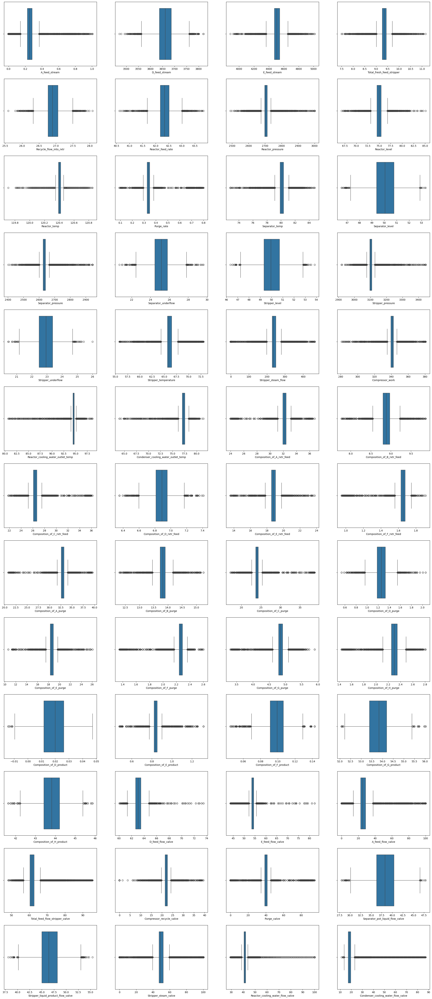

In [40]:

# Create a box plot for each variable


fig, ax = plt.subplots(13,4,figsize=(30,70))

for i,column in enumerate( DF[DF['simulationRun']==1].columns[3:]):   #select all the feature columns to plot
    sns.boxplot(data= DF[DF['simulationRun']==1],x=column,ax=ax.ravel()[i])

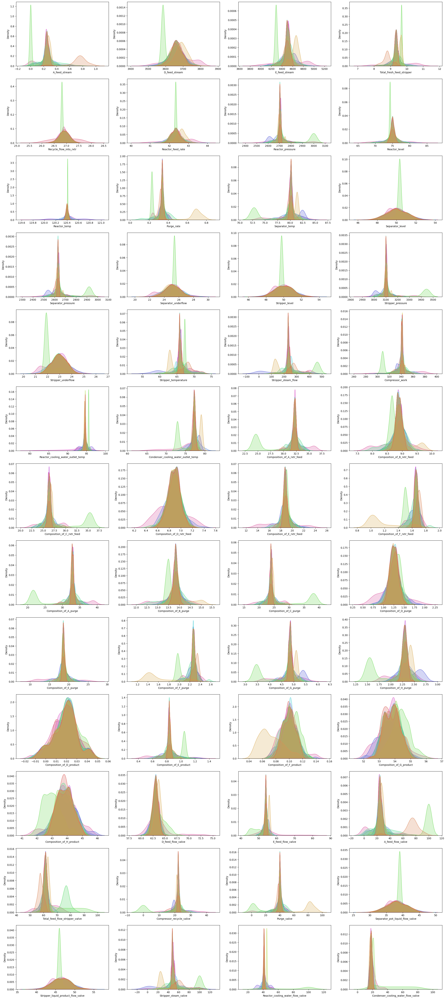

In [41]:
fig, ax = plt.subplots(13,4,figsize=(30,70))

for i,column in enumerate( DF[DF['simulationRun']==1].columns[3:]):   #select all the feature columns to plot
    sns.kdeplot(data= DF[DF['simulationRun']==1], x=column, hue="faultNumber",palette="hls",ax=ax.ravel()[i],fill=True, legend=False)

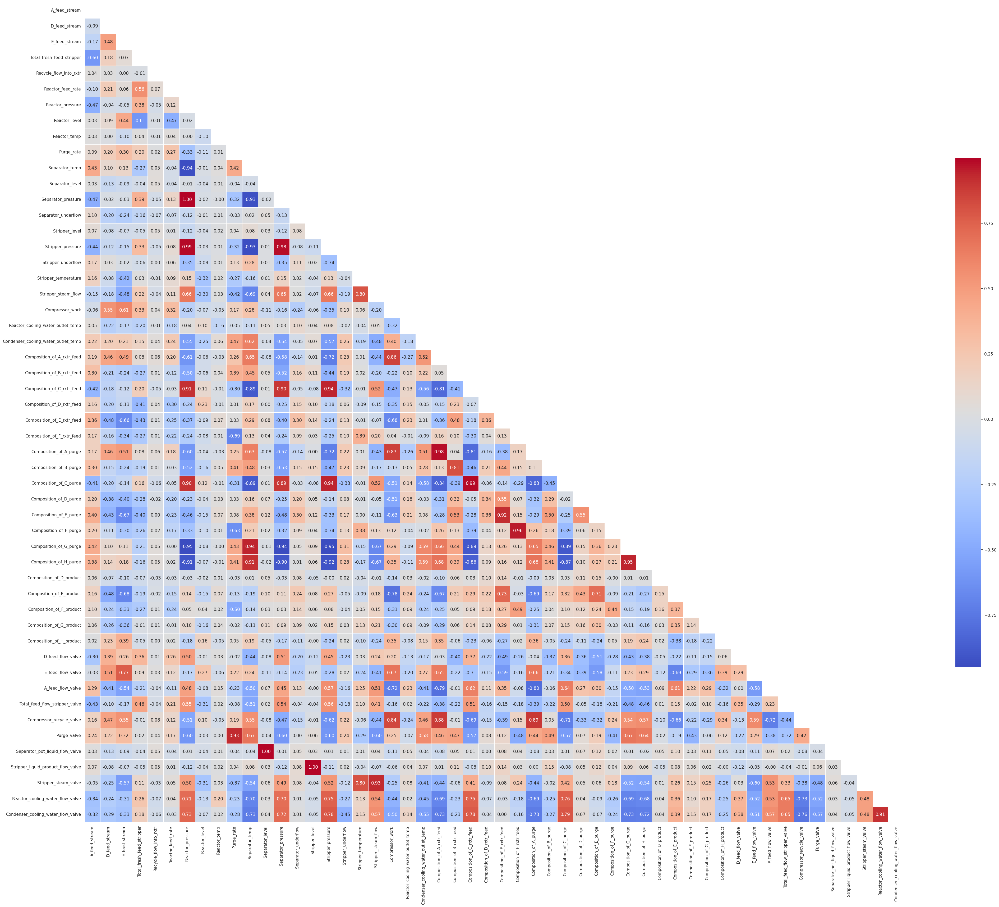

In [42]:


# Calculate the correlation matrix
corr = DF[DF['simulationRun']==1].iloc[:,3:].corr()

# Create a heatmap with annotations
sns.set(style='white')
mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(50, 50))
sns.heatmap(corr, mask=mask, cmap='coolwarm', annot=True, fmt='.2f',
            square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.show()

In [43]:


# Define a threshold for high correlation (e.g., 0.9)
correlation_threshold = 0.95

# Find the correlation matrix
corr_matrix = corr.abs()

# Identify the pairs of features with correlation higher than the threshold
high_corr_pairs = np.where(corr_matrix > correlation_threshold)

# Store pairs of highly correlated features (excluding self-correlations)
high_corr_pairs = [(corr_matrix.index[x], corr_matrix.columns[y])
                   for x, y in zip(*high_corr_pairs) if x != y]

# Use a set to store features that will be removed to avoid redundancy
to_remove = set()

# Iterate through pairs of highly correlated features
for feature1, feature2 in high_corr_pairs:
    if feature1 not in to_remove and feature2 not in to_remove:
        # Print the highly correlated pair and their correlation
        correlation_value = corr_matrix.loc[feature1, feature2]
        print(f"Highly correlated pair: {feature1}, {feature2} (Correlation: {correlation_value:.2f})")

        # Remove one feature (you can choose to remove feature2 here)
        to_remove.add(feature2)
        print(f"Removing: {feature2}")

# Drop the highly correlated features from the DataFrame
reduced_data = DF.drop(columns=to_remove)

# Print the total number of removed features
print(f"Total number of removed features: {len(to_remove)}")

# Print the removed features
print("Removed features:", to_remove)


Highly correlated pair: Reactor_pressure, Separator_pressure (Correlation: 1.00)
Removing: Separator_pressure
Highly correlated pair: Reactor_pressure, Stripper_pressure (Correlation: 0.99)
Removing: Stripper_pressure
Highly correlated pair: Separator_level, Separator_pot_liquid_flow_valve (Correlation: 1.00)
Removing: Separator_pot_liquid_flow_valve
Highly correlated pair: Stripper_level, Stripper_liquid_product_flow_valve (Correlation: 1.00)
Removing: Stripper_liquid_product_flow_valve
Highly correlated pair: Composition_of_A_rxtr_feed, Composition_of_A_purge (Correlation: 0.98)
Removing: Composition_of_A_purge
Highly correlated pair: Composition_of_C_rxtr_feed, Composition_of_C_purge (Correlation: 0.99)
Removing: Composition_of_C_purge
Highly correlated pair: Composition_of_F_rxtr_feed, Composition_of_F_purge (Correlation: 0.96)
Removing: Composition_of_F_purge
Total number of removed features: 7
Removed features: {'Stripper_pressure', 'Composition_of_A_purge', 'Composition_of_F_pur

In [ ]:
reduced_data = reduced_data[reduced_data['faultNumber'] != 3]
reduced_data = reduced_data[reduced_data['faultNumber'] != 9]
reduced_data = reduced_data[reduced_data['faultNumber'] != 15]
